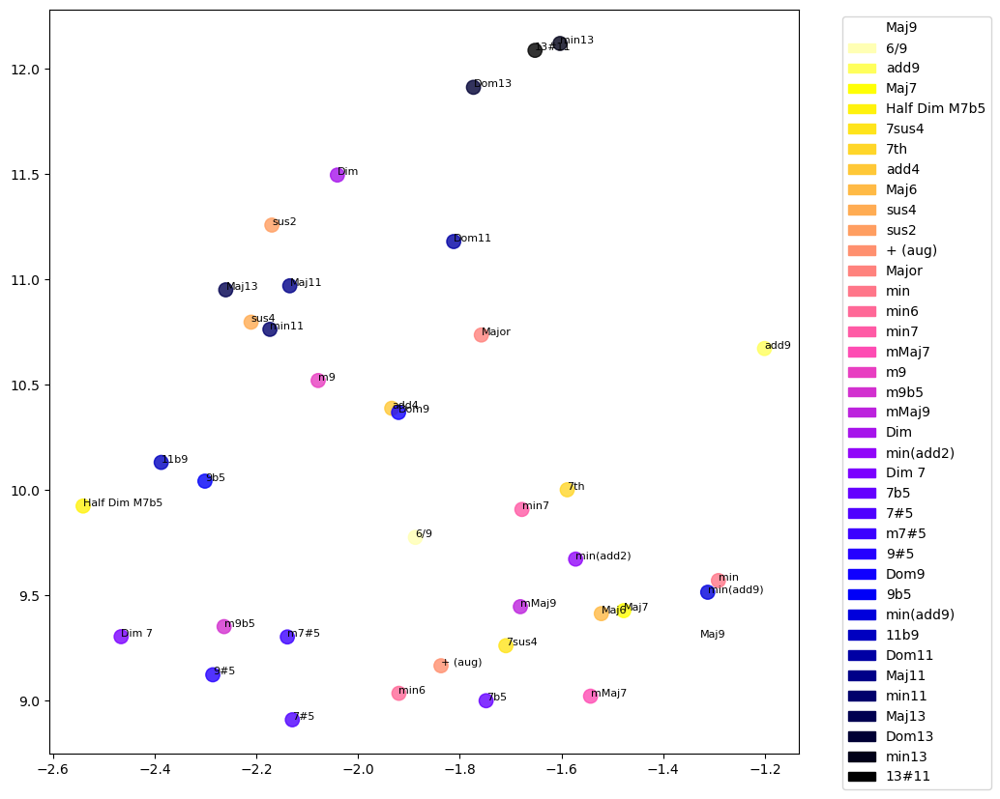

In [4]:
# Assuming dissimilarity_matrix_chord_qualities is a matrix that contains your dissimilarity values
tsne = TSNE(n_components=2, random_state=1)
embedding_chord_qualities = tsne.fit_transform(dissimilarity_matrix_chord_qualities)

# Create a color map
cmap = plt.get_cmap('gnuplot2_r')
colors = cmap(np.linspace(0, 1, len(df_chord_qualities)))

# Create a scatter plot with larger dots and 80% alpha
plt.figure(figsize=(10, 10))
sc = plt.scatter(embedding_chord_qualities[:, 0], embedding_chord_qualities[:, 1], c=colors, alpha=0.8, s=3*plt.rcParams['lines.markersize'] ** 2)

# Annotate the plot with smaller text
for i, txt in enumerate(df_chord_qualities.index):
    plt.annotate(txt, (embedding_chord_qualities[i, 0], embedding_chord_qualities[i, 1]), fontsize=0.8*plt.rcParams['font.size'])

# Create a legend with custom entries
from matplotlib.patches import Patch
legend_entries = [Patch(facecolor=c, edgecolor=c, label=l) for c, l in zip(colors, df_chord_qualities.index)]
plt.legend(handles=legend_entries, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

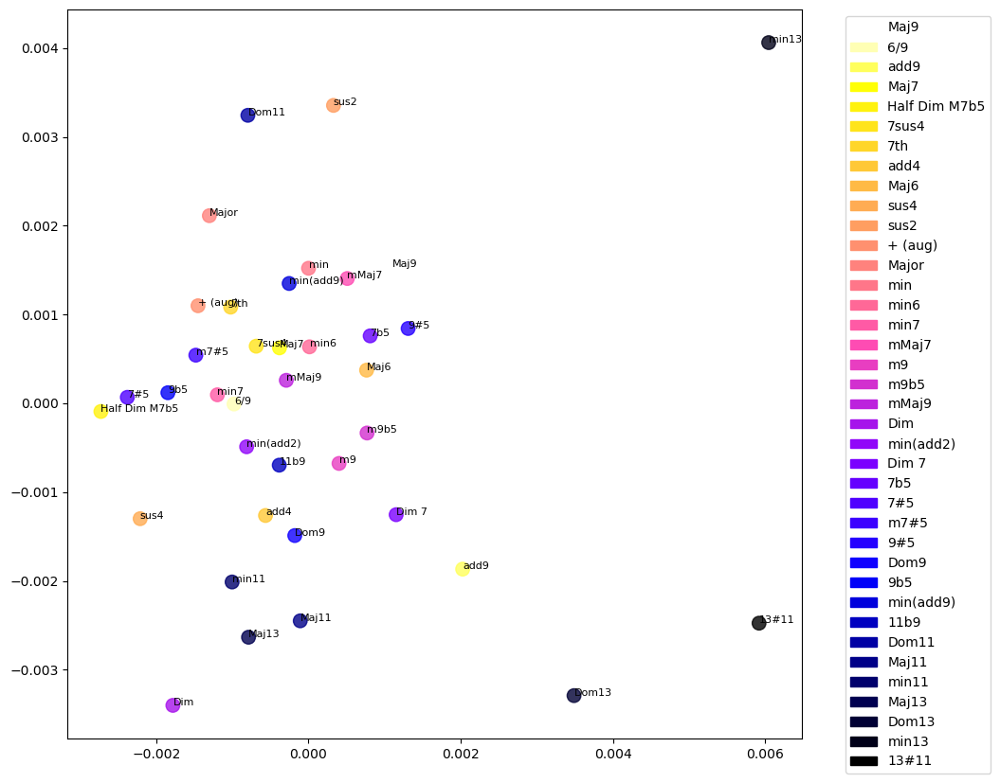

In [5]:
# Create a new DataFrame that contains only the pairwise relationships of the chord qualities
df['Chord Quality'] = [label.split(' vs ')[1] for label in df.index]
df_chord_qualities = df.groupby('Chord Quality', sort=False).mean()

# Calculate the pairwise dissimilarity (distance) between chord qualities only
distances_chord_qualities = distance.pdist(df_chord_qualities.values, 'euclidean')

# Convert the condensed distance matrix returned by pdist to a square matrix
dissimilarity_matrix_chord_qualities = distance.squareform(distances_chord_qualities)

# Assuming dissimilarity is a matrix that contains your dissimilarity values
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=1, normalized_stress='auto')
# Fit the data
result_chord_qualities = mds.fit(dissimilarity_matrix_chord_qualities)

# Assuming dissimilarity_matrix_chord_qualities is a matrix that contains your dissimilarity values
tsne = TSNE(n_components=2, random_state=1)
embedding_chord_qualities = tsne.fit_transform(dissimilarity_matrix_chord_qualities)

# Get the embedding
embedding_chord_qualities = result_chord_qualities.embedding_

# Create a color map
cmap = plt.get_cmap('gnuplot2_r')
colors = cmap(np.linspace(0, 1, len(df_chord_qualities)))

# Create a scatter plot with larger dots and 80% alpha
plt.figure(figsize=(10, 10))
sc = plt.scatter(embedding_chord_qualities[:, 0], embedding_chord_qualities[:, 1], c=colors, alpha=0.8, s=3*plt.rcParams['lines.markersize'] ** 2)

# Annotate the plot with smaller text
for i, txt in enumerate(df_chord_qualities.index):
    plt.annotate(txt, (embedding_chord_qualities[i, 0], embedding_chord_qualities[i, 1]), fontsize=0.8*plt.rcParams['font.size'])

# Create a legend with custom entries
from matplotlib.patches import Patch
legend_entries = [Patch(facecolor=c, edgecolor=c, label=l) for c, l in zip(colors, df_chord_qualities.index)]
plt.legend(handles=legend_entries, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [6]:
# Print the DataFrame
print(df)


                       Waveform Area 0-0.002s  Envelope Area 0-0.002s  \
Maj9 vs Maj9                         0.000000                0.000000   
Maj9 vs 6/9                          0.000732                0.003060   
Maj9 vs add9                         0.001236                0.003324   
Maj9 vs Maj7                         0.001286                0.006807   
Maj9 vs Half Dim M7b5                0.001264                0.005856   
...                                       ...                     ...   
13#11 vs min11                       0.001660                0.004948   
13#11 vs Maj13                       0.000749                0.003942   
13#11 vs Dom13                       0.000528                0.001163   
13#11 vs min13                       0.000599                0.002409   
13#11 vs 13#11                       0.000000                0.000000   

                       Trace Area 0-0.002s  Waveform Area 0.002-0.007s  \
Maj9 vs Maj9                      0.000000       

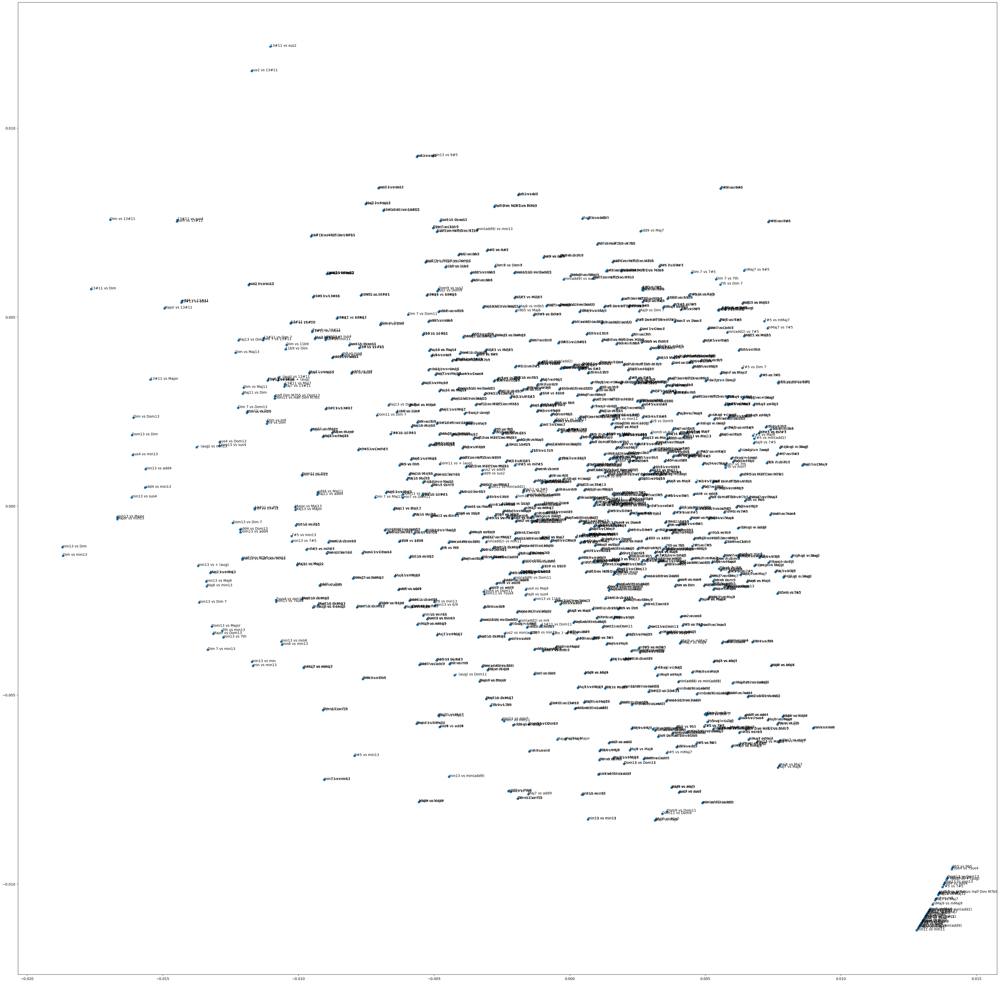

In [7]:
# Calculate the pairwise dissimilarity (distance) between all data points
distances = distance.pdist(all_areas, 'euclidean')

# Convert the condensed distance matrix returned by pdist to a square matrix
dissimilarity_matrix = distance.squareform(distances)

# Assuming dissimilarity is a matrix that contains your dissimilarity values
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=1, normalized_stress='auto')

# Add a small constant to the dissimilarity matrix to avoid division by zero
dissimilarity_matrix += 1e-5

# Fit the data
result = mds.fit(dissimilarity_matrix)

# Get the embedding
embedding = result.embedding_

# Plot the results
plt.figure(figsize=(50, 50))
plt.scatter(embedding[:, 0], embedding[:, 1])
for i, txt in enumerate(all_labels):
    plt.annotate(txt, (embedding[i, 0], embedding[i, 1]))
plt.show()

In [9]:
# Calculate the pairwise dissimilarity (distance) between all data points
distances = distance.pdist(all_areas, 'euclidean')

# Convert the condensed distance matrix returned by pdist to a square matrix
dissimilarity_matrix = distance.squareform(distances)

# Assuming dissimilarity is a matrix that contains your dissimilarity values
tsne = TSNE(n_components=2, random_state=1)

# Fit the data
embedding = tsne.fit_transform(dissimilarity_matrix)

# Create a color map
cmap = plt.get_cmap('gnuplot2_r')
colors = cmap(np.linspace(0, 1, len(all_labels)))

# Create a scatter plot with larger dots and 80% alpha
plt.figure(figsize=(50, 50))
sc = plt.scatter(embedding[:, 0], embedding[:, 1], c=colors, alpha=0.8, s=5*3*plt.rcParams['lines.markersize'] ** 2)

# Annotate the plot with smaller text
# for i, txt in enumerate(all_labels):
#     plt.annotate(txt, (embedding[i, 0], embedding[i, 1]), fontsize=0.8*plt.rcParams['font.size'])

# Create a legend with custom entries
from matplotlib.patches import Patch
legend_entries = [Patch(facecolor=c, edgecolor=c, label=l) for c, l in zip(colors, all_labels)]
plt.legend(handles=legend_entries, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

C:\Users\murrm\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\murrm\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


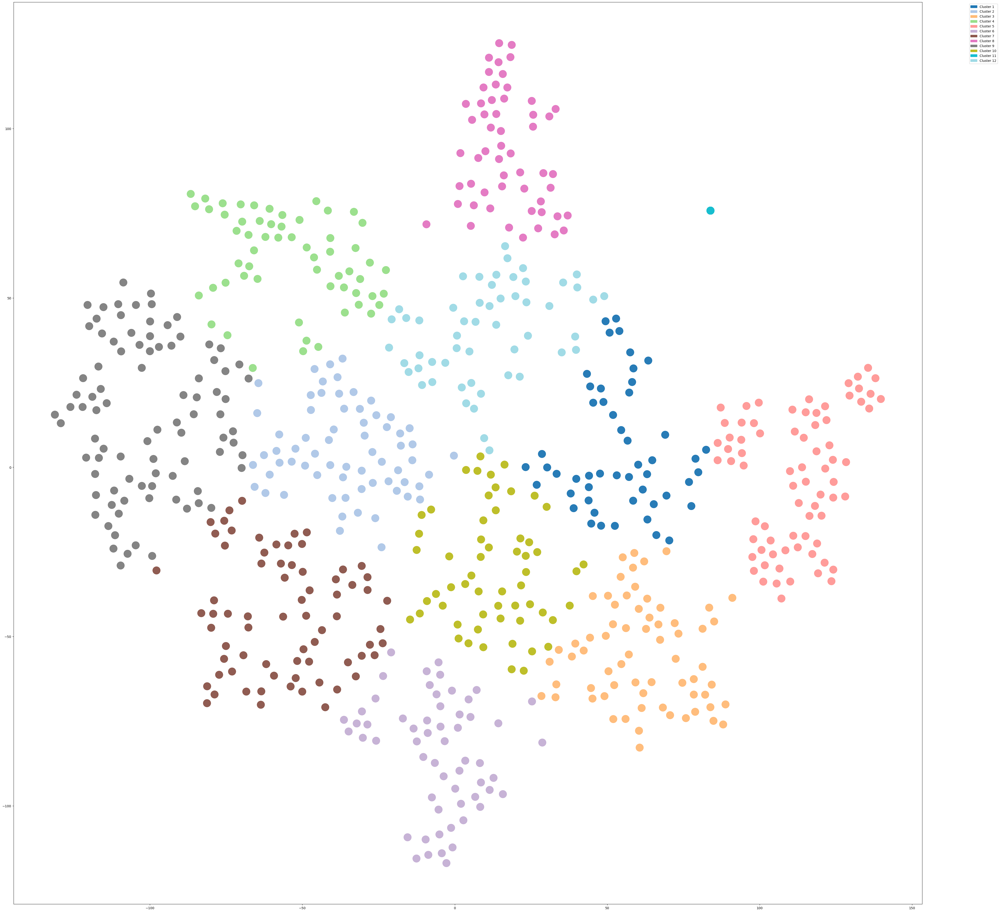

In [10]:
from sklearn.cluster import KMeans

# Fit KMeans with 12 clusters
kmeans = KMeans(n_clusters=12, random_state=1)
clusters = kmeans.fit_predict(embedding)

# Create a color map with 12 distinct colors
cmap = plt.get_cmap('tab20')  # 'tab20' is a colormap with 20 distinct colors
colors = cmap(np.linspace(0, 1, 12))

# Create a scatter plot with colors based on cluster assignment
plt.figure(figsize=(50, 50))
sc = plt.scatter(embedding[:, 0], embedding[:, 1], c=colors[clusters], alpha=0.8, s=5*3*plt.rcParams['lines.markersize'] ** 2)

# Create a legend with custom entries
legend_entries = [Patch(facecolor=c, edgecolor=c, label=f'Cluster {i+1}') for i, c in enumerate(colors)]
plt.legend(handles=legend_entries, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [11]:
# Let's assume you have a DataFrame with chord quality transitions
df_transitions = pd.DataFrame({
    'Chord Quality': ['Major', 'min', '7th', 'Maj7', 'min7', 'Maj9', 'Dom9', 'min9', 'Maj11', 'Dom11', 'min11', 'Maj13'],
    'Transition': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2]
})

# Map each chord quality to a cluster
df_transitions['Cluster'] = df_transitions['Chord Quality'].map(dict(zip(all_labels, clusters)))

# Assign a color to each transition based on its cluster
df_transitions['Color'] = df_transitions['Cluster'].map(dict(zip(range(12), colors)))

# Now df_transitions has a 'Color' column that you can use to color the transitions
print(df_transitions)

   Chord Quality  Transition  Cluster Color
0          Major         0.1      NaN   NaN
1            min         0.2      NaN   NaN
2            7th         0.3      NaN   NaN
3           Maj7         0.4      NaN   NaN
4           min7         0.5      NaN   NaN
5           Maj9         0.6      NaN   NaN
6           Dom9         0.7      NaN   NaN
7           min9         0.8      NaN   NaN
8          Maj11         0.9      NaN   NaN
9          Dom11         1.0      NaN   NaN
10         min11         1.1      NaN   NaN
11         Maj13         1.2      NaN   NaN


C:\Users\murrm\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\murrm\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


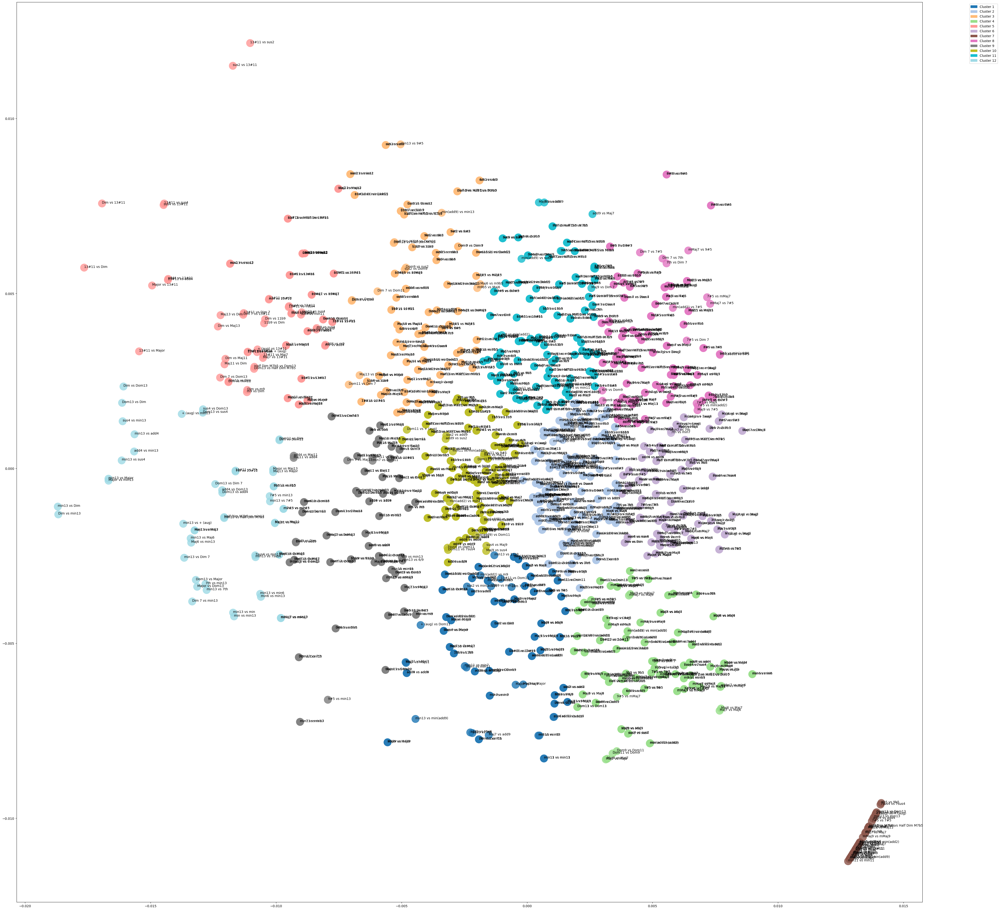

In [13]:
from sklearn.cluster import KMeans

# Fit KMeans with 12 clusters
kmeans = KMeans(n_clusters=12, random_state=1)
clusters = kmeans.fit_predict(embedding)

# Create a color map with 12 distinct colors
cmap = plt.get_cmap('tab20')  # 'tab20' is a colormap with 20 distinct colors
colors = cmap(np.linspace(0, 1, 12))

# Create a scatter plot with colors based on cluster assignment
plt.figure(figsize=(50, 50))
sc = plt.scatter(embedding[:, 0], embedding[:, 1], c=colors[clusters], alpha=0.8, s=5*3*plt.rcParams['lines.markersize'] ** 2)

# Annotate each point with its label
for i, txt in enumerate(all_labels):
    plt.annotate(txt, (embedding[i, 0], embedding[i, 1]))

# Create a legend with custom entries
legend_entries = [Patch(facecolor=c, edgecolor=c, label=f'Cluster {i+1}') for i, c in enumerate(colors)]
plt.legend(handles=legend_entries, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()